# Spectral Observables in the MOXSI Bandpass

Some basic experiments with computing some spectra for simple cases where we vary the abundance factor and the form of the DEM.
This is to help get a better handle on what our throughput is and to start thinking about what a basic metric would be for still achieving our science goals while varying the parameters of the instrument design.

For this set of experiments, vary two parameters:

- Abundances: coronal and photospheric
- DEM: flare and active region

We will extend this to some more more exciting DEMs if there is time

In [194]:
import pathlib
import numpy as np
import astropy.units as u
import matplotlib.pyplot as plt
from astropy.visualization import quantity_support, ImageNormalize, LogStretch, AsymmetricPercentileInterval
from astropy.convolution import convolve, Gaussian1DKernel
import ndcube
from ndcube.extra_coords import QuantityTableCoordinate
import h5py
import fiasco

from fiasco.io import Parser
from synthesizAR.instruments import InstrumentDEM

from mocksipipeline.physics.spectral import get_spectral_tables
from mocksipipeline.detector.response import SpectrogramChannel, convolve_with_response, ThinFilmFilter

%matplotlib inline

In [6]:
def get_abundance(element, abundance_filename):
    el = fiasco.Element(element, 1*u.MK, abundance_filename=abundance_filename)
    return el.abundance

In [7]:
def dem_table_to_ndcube(dem, temperature, meta=None):
    tab_coord = QuantityTableCoordinate(temperature,
                                        names='temperature',
                                        physical_types='phys.temperature')
    return ndcube.NDCube(dem, wcs=tab_coord.wcs, meta=meta)

In [8]:
line_ids = [
    ('Fe XVIII',14.21*u.angstrom),  # also targeted by MaGIXS
    ('Fe XVII', 15.01*u.angstrom),  # also targeted by MaGIXS
    ('Fe XVII', 16.78*u.AA),
    ('Fe XVII', 17.05*u.AA),
    ('O VII', 21.60*u.angstrom),  # also targeted by MaGIXS
    ('O VII', 21.81*u.angstrom),
    ('O VII', 22.10*u.AA),
    ('O VIII', 18.97*u.angstrom),  # also targeted by MaGIXS
    ('Fe XXV', 1.86*u.AA),
    ('Ca XIX', 3.21*u.AA),
    ('Si XIII', 6.74*u.AA),
    ('Mg XI', 9.32*u.AA),
    ('Fe XVII', 11.25*u.AA),
    ('Fe XX', 12.83*u.AA),
    ('Ne IX', 13.45*u.AA),
    ('Fe XIX', 13.53*u.AA),
    ('C VI', 33.73*u.AA),
    ('C V', 40.27*u.AA),
    ('Si XII', 44.16*u.AA),
    ('Si XI', 49.18*u.AA),
]

In [246]:
def add_line_ids_to_axis(ax, line_ids, rotation=90):
    for ion,line in line_ids:
        ax.axvline(x=ax.wcs.world_to_pixel(line), ls=':', color='k',)
    ax2 = ax.secondary_xaxis('top') 
    ax2.set_xticks(ax.wcs.world_to_pixel(u.Quantity([l for _,l in line_ids])),
                   labels=[f'{ion}, {line.to_string(format="latex_inline")}' for ion,line in line_ids],
                   rotation=rotation,
                   horizontalalignment='center',
                   #verticalalignment='center'
                  )

In [91]:
def get_line_ratio(spectra, line_num, line_denom):
    wavelengths = spectra.axis_world_coords(0)[0]
    i_num = np.argmin(np.fabs(wavelengths - line_num))
    i_denom = np.argmin(np.fabs(wavelengths - line_denom))
    ratio = spectra.data[i_num] / spectra.data[i_denom]
    return ratio

In [10]:
dem_cubes = []
for fname in ['flare.dem', 'active_region.dem', 'quiet_sun.dem']:
    p = Parser(fname, ascii_dbase_root='/Users/wtbarnes/ssw/packages/chianti/dbase/')
    tab = p.parse()
    dem_cubes.append((fname, dem_table_to_ndcube(tab['em'], tab['temperature_bin_center'], meta=tab.meta)))
dem_flare_scaled_data = dem_cubes[0][1].data / dem_cubes[0][1].data.max() * 2e27 * dem_cubes[0][1].unit
dem_cubes.append(('flare_scaled.dem', ndcube.NDCube(dem_flare_scaled_data, wcs=dem_cubes[0][1].wcs, meta=dem_cubes[0][1].meta)))
dem_models = ndcube.NDCollection(dem_cubes)

In [311]:
dem_cubes[0][1].data.max() / 2e27

6429.01856626747

In [11]:
for m in dem_models:
    print(dem_models[m].meta['footer'])

filename: flare.dem
dem: Dere, K.P., Cook, J.W., 1979, ApJ, 229, 772
comment: composite of August 9 1553 and 1554 UT data of an M2 X-ray class flare
produced as part of the Arcetri/Cambridge/NRL 'CHIANTI' atomic data base collaboration
K.P.Dere  - Aug 2002
filename: active_region.dem
dem: produced by chianti_dem.pro
Comment: the DEM was derived using the Vernazza & Reeves 1978 ApJSS, 37, 485 average Active Region,
the sun_coronal.abund file and a constant pressure of 3.00e+15 cm-3 K.
produced as part of the Arcetri/Cambridge/NRL 'CHIANTI' atomic data base collaboration
K.P.Dere  - Aug 2002
filename: quiet_sun.dem
dem: produced by chianti_dem.pro
Comment: the DEM was derived using the Vernazza & Reeves 1978 ApJSS, 37, 485 average Quiet Sun,
the sun_coronal.abund file and a constant pressure of 3.00e+15 cm-3 K.
produced as part of the Arcetri/Cambridge/NRL 'CHIANTI' atomic data base collaboration
K.P.Dere  - Aug 2002
filename: flare.dem
dem: Dere, K.P., Cook, J.W., 1979, ApJ, 229, 772
co

In [12]:
spec_tables = get_spectral_tables()

(0.0, 1270.909090909091)

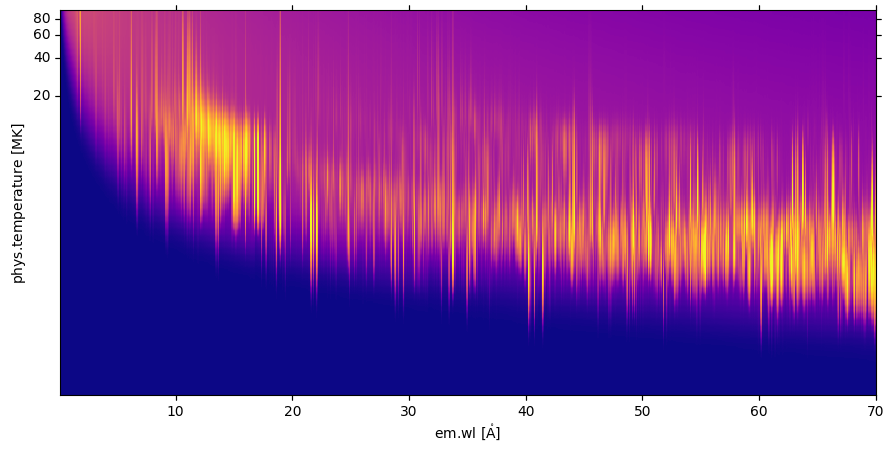

In [215]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(projection=spec_tables['sun_coronal_1992_feldman_ext_all'].wcs)
vmin, vmax = AsymmetricPercentileInterval(1,98).get_limits(
    spec_tables['sun_coronal_1992_feldman_ext_all'].data)
spec_tables['sun_coronal_1992_feldman_ext_all'].plot(axes=ax, aspect=10,
                  axes_units=('MK','Angstrom'),
                  norm=ImageNormalize(vmin=vmin, vmax=vmax, stretch=LogStretch()),
                  cmap='plasma')
#fig.colorbar(ax.get_images()[0], label=spec_tables['sun_coronal_1992_feldman_ext_all'].unit)
#ax.set_title('CHIANTI Spectra (coronal abundances)')
ax.set_xlim(
    spec_tables['sun_coronal_1992_feldman_ext_all'].wcs.world_to_pixel([0.1,70]*u.Angstrom,0*u.MK)[0])
#add_line_ids_to_axis(ax, line_ids)

In [13]:
polymide_thin = ThinFilmFilter(elements=['C','H','N','O'],
                          quantities=[22,10,2,5],
                          density=1.43*u.g/u.cm**3,
                          thickness = 100*u.nm, xrt_table='Chantler')
al_thin = ThinFilmFilter(elements='Al', thickness=100*u.nm, xrt_table='Chantler')

In [14]:
chan = SpectrogramChannel(1, [al_thin, polymide_thin])

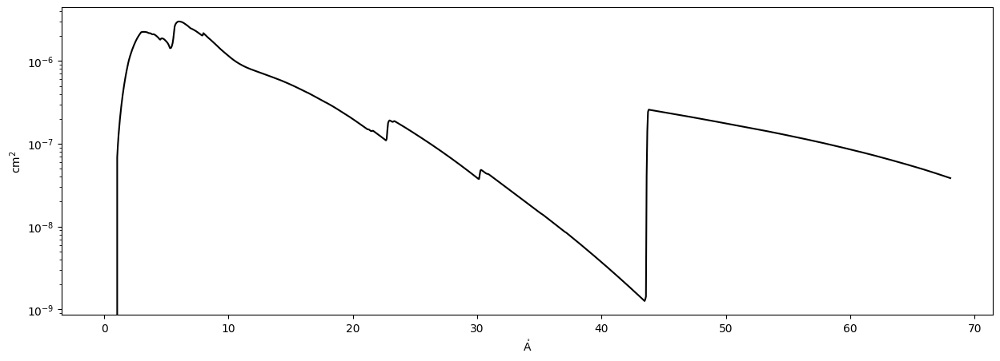

In [220]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot()
with quantity_support():
    ax.plot(chan.wavelength, chan.effective_area, color='k')
ax.set_yscale('log')

In [234]:
std = 0.5*u.angstrom / (2*np.sqrt(2*np.log(2)))  # FWHM is 0.5 so convert to sigma using W = 2\sqrt{2\ln2}\sigma
std_eff = (std/chan.spectral_resolution).to_value('pix')  # Scale sigma by bin width
kernel = Gaussian1DKernel(std_eff)

def degrade_spectra(spec, conv_kernel):
    data_smooth = convolve(spec.data, conv_kernel)
    return ndcube.NDCube(data_smooth, wcs=spec.wcs, meta=spec.meta, unit=spec.unit)

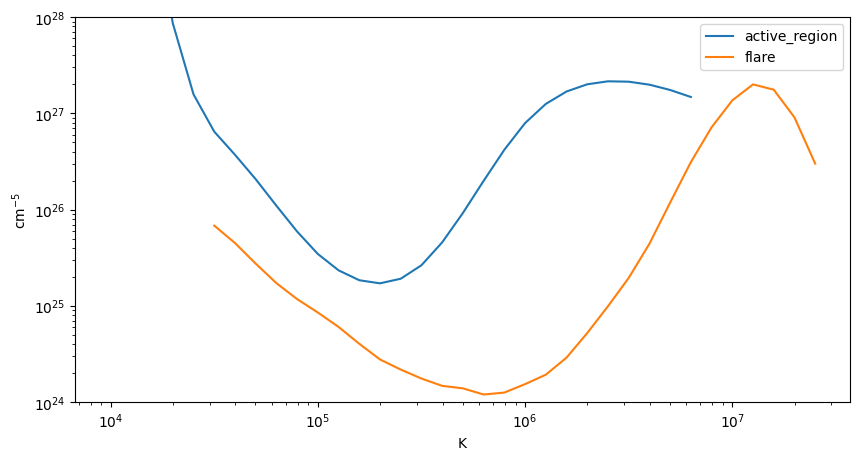

In [212]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot()
with quantity_support():
    for model in [dem_models['active_region.dem'], dem_models['flare_scaled.dem']]:
        ax.plot(model.axis_world_coords(0)[0], model.data*model.unit, label=model.meta['filename'].split('.')[0])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim(1e24, 1e28)
ax.legend()

## Effect of Blurring

In [58]:
ar_coronal_flux = convolve_with_response(InstrumentDEM.calculate_intensity(dem_models['active_region.dem'],
                                                                           spec_tables['sun_coronal_1992_feldman_ext_all'], {}),
    chan,
    electrons=False,
)
ar_coronal_flux_blurred = degrade_spectra(ar_coronal_flux, kernel)

/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


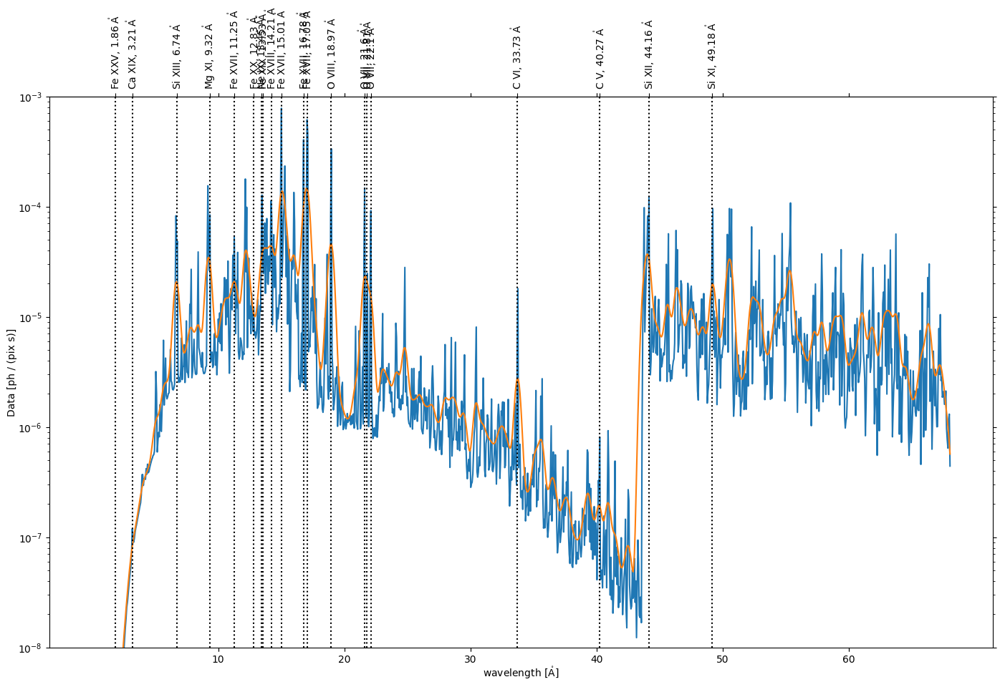

In [59]:
fig = plt.figure(figsize=(17,10))
ax = fig.add_subplot(111, projection=ar_coronal_flux.wcs)
ar_coronal_flux.plot(axes=ax)
ar_coronal_flux_blurred.plot(axes=ax)
ax.set_yscale('log')
ax.set_ylim(1e-8,1e-3)
add_line_ids_to_axis(ax,line_ids)

## DEM Comparison

In [221]:
intensity_ar = InstrumentDEM.calculate_intensity(
    dem_models['active_region.dem'],
    spec_tables['sun_coronal_1992_feldman_ext_all'], {})
intensity_flare = InstrumentDEM.calculate_intensity(
    dem_models['flare.dem'],
    spec_tables['sun_coronal_1992_feldman_ext_all'], {})
intensity_flare_scaled = InstrumentDEM.calculate_intensity(
    dem_models['flare_scaled.dem'],
    spec_tables['sun_coronal_1992_feldman_ext_all'], {})

In [222]:
flux_ar = convolve_with_response(intensity_ar, chan, electrons=False,)
flux_flare = convolve_with_response(intensity_flare, chan, electrons=False)
flux_flare_scaled = convolve_with_response(intensity_flare_scaled, chan, electrons=False)

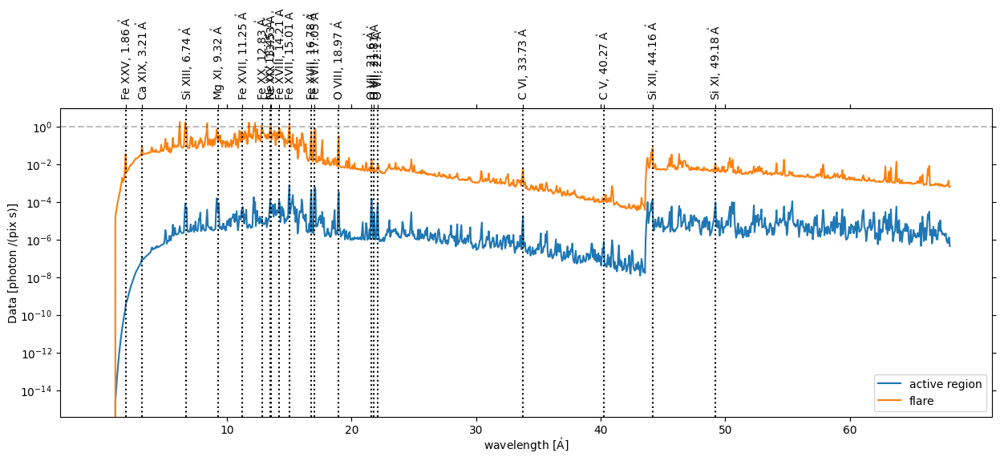

In [223]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111,projection=flux_ar.wcs)
flux_ar.plot(axes=ax, data_unit='photon /(pix s)', label='active region')
flux_flare.plot(axes=ax, data_unit='photon /(pix s)',label='flare')
ax.axhline(y=1, color='k', ls='--', alpha=0.25)
ax.set_yscale('log')
#ax.set_ylim(1e-9,2)
ax.legend()
add_line_ids_to_axis(ax, line_ids)

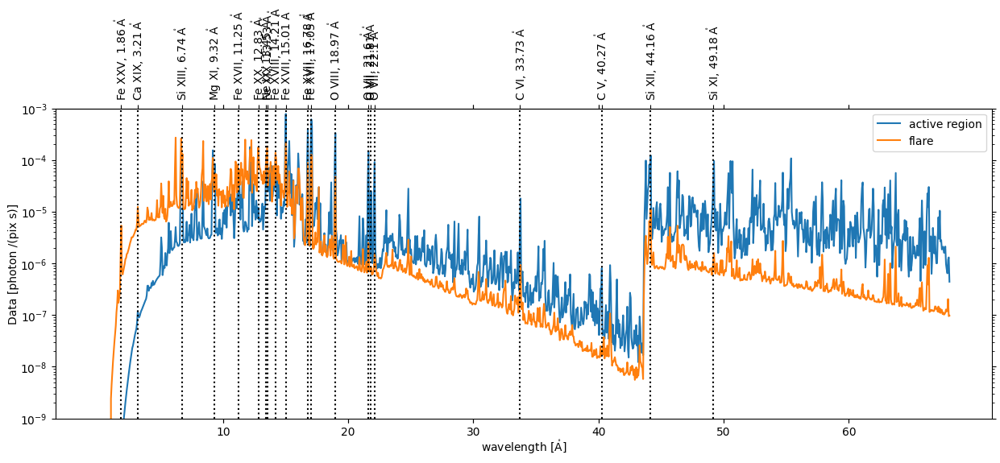

In [312]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111,projection=flux_ar.wcs)
flux_ar.plot(axes=ax, data_unit='photon /(pix s)', label='active region')
flux_flare_scaled.plot(axes=ax, data_unit='photon /(pix s)',label='flare')
#ax.axhline(y=1, color='k', ls='--', alpha=0.25)
ax.set_yscale('log')
ax.set_ylim(1e-9,1e-3)
ax.legend()
add_line_ids_to_axis(ax, line_ids)

## Abundance Comparison

In [64]:
intensity_coronal = InstrumentDEM.calculate_intensity(dem_models['active_region.dem'],
                                                      spec_tables['sun_coronal_1992_feldman_ext_all'], {})
intensity_photospheric = InstrumentDEM.calculate_intensity(dem_models['active_region.dem'],
                                                           spec_tables['sun_photospheric_2015_scott_all'], {})

In [65]:
flux_coronal = convolve_with_response(intensity_coronal, chan, electrons=False,)
flux_photospheric = convolve_with_response(intensity_photospheric, chan, electrons=False)

/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


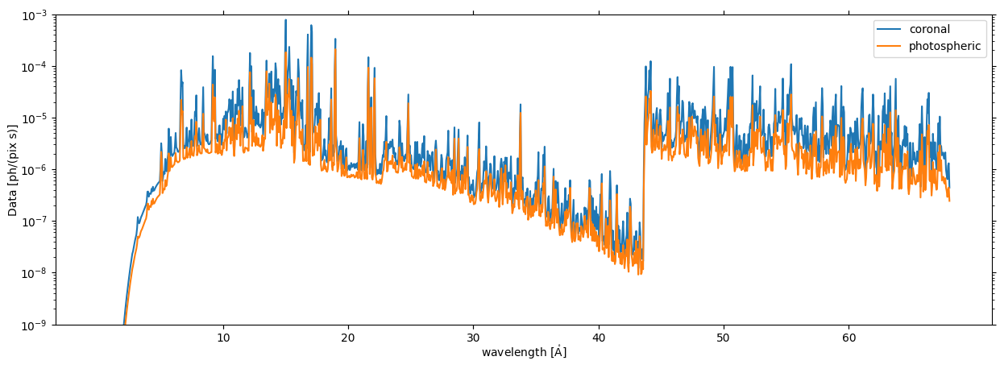

In [66]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111,projection=flux_coronal.wcs)
flux_coronal.plot(axes=ax, data_unit='ph /(pix s)', label='coronal')
flux_photospheric.plot(axes=ax, data_unit='ph/(pix s)', label='photospheric')
ax.set_yscale('log')
ax.set_ylim(1e-9,1e-3)
ax.legend()

/var/folders/cr/pj7yk8p976d7ny98bgvlpfyr0000gq/T/ipykernel_26186/1251970359.py:2: RuntimeWarning: invalid value encountered in divide
  plt.plot(flux_coronal.axis_world_coords(0)[0], flux_coronal.data/flux_photospheric.data)


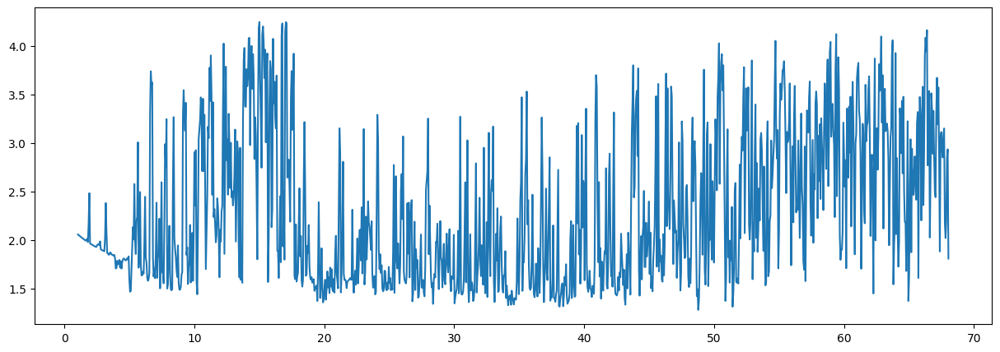

In [67]:
fig = plt.figure(figsize=(15,5))
plt.plot(flux_coronal.axis_world_coords(0)[0], flux_coronal.data/flux_photospheric.data)

## Element Comparison

For each element, generate a plot for the AR DEM and the flare DEM.
On each plot, show the coronal and photospheric abundances for all elements and then show the coronal and photospheric abundances for each element individually.

In [235]:
flare_coronal_all_flux = degrade_spectra(
    convolve_with_response(
        InstrumentDEM.calculate_intensity(dem_models['flare_scaled.dem'], spec_tables['sun_coronal_1992_feldman_ext_all'], {}),
        chan,
        electrons=False,
    ),
    kernel
)
flare_photospheric_all_flux = degrade_spectra(
    convolve_with_response(
        InstrumentDEM.calculate_intensity(dem_models['flare_scaled.dem'], spec_tables['sun_photospheric_2015_scott_all'], {}),
        chan,
        electrons=False,
    ),
    kernel
)
ar_coronal_all_flux = degrade_spectra(
    convolve_with_response(
        InstrumentDEM.calculate_intensity(dem_models['active_region.dem'], spec_tables['sun_coronal_1992_feldman_ext_all'], {}),
        chan,
        electrons=False,
    ),
    kernel
)
ar_photospheric_all_flux = degrade_spectra(
    convolve_with_response(
        InstrumentDEM.calculate_intensity(dem_models['active_region.dem'], spec_tables['sun_photospheric_2015_scott_all'], {}),
        chan,
        electrons=False,
    ),
    kernel
)

/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/a

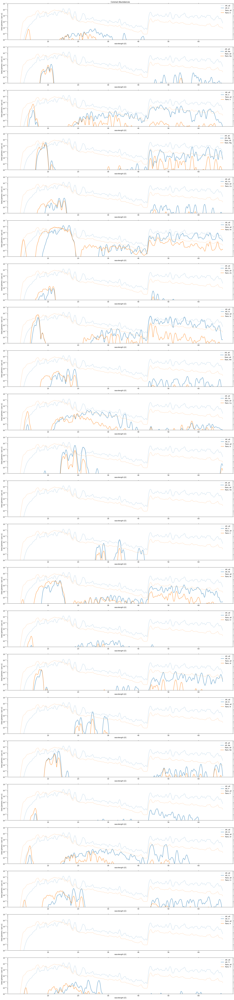

In [69]:
n_els = len(spec_tables) - 2
fig = plt.figure(figsize=(26, n_els*5))
counter = 1
# Get DEM
ar_dem = dem_models['active_region.dem']
flare_dem = dem_models['flare_scaled.dem']
# Line properties
all_line_props = {'data_unit': 'photon / (pix s)',
                  #'label': 'all',
                  #'color': 'k',
                  'ls': '-',
                  'alpha': 0.3}
for k in spec_tables:
    el = k.split('_')[-1]
    if el == 'all':
        continue
    ax = fig.add_subplot(n_els, 1, counter, projection=ar_coronal_all_flux.wcs)
    # Get spectral tables and multiply by abundances
    spt = spec_tables[k] * get_abundance(el, 'sun_coronal_1992_feldman_ext')
    # Active region coronal
    ar_coronal_all_flux.plot(axes=ax, **all_line_props, color='C0', label='AR, all')
    ar_coronal_el = degrade_spectra(convolve_with_response(InstrumentDEM.calculate_intensity(ar_dem, spt, {}), chan, electrons=False), kernel)
    ar_coronal_el.plot(axes=ax, data_unit='photon / (pix s)', label=f'AR, {el.capitalize()}', color='C0')
    # Flare coronal
    flare_coronal_all_flux.plot(axes=ax, **all_line_props, color='C1', label='flare, all')
    flare_coronal_el = degrade_spectra(convolve_with_response(InstrumentDEM.calculate_intensity(flare_dem, spt, {}), chan, electrons=False), kernel)
    flare_coronal_el.plot(axes=ax, data_unit='photon / (pix s)', label=f'flare, {el.capitalize()}', color='C1')
    ax.set_ylim(1e-9,1e-3)
    #ax.set_xlim(ar_coronal_all_flux.wcs.world_to_pixel([13,18]*u.angstrom))
    ax.set_yscale('log')
    if counter == 1:
        ax.set_title('Coronal Abundances')
    ax.legend(frameon=False)
    counter += 1

/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/a

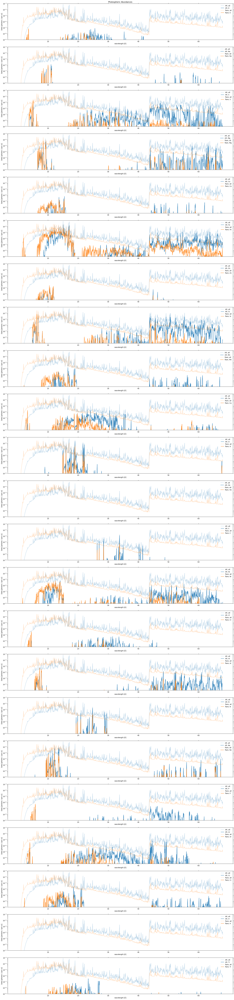

In [50]:
fig = plt.figure(figsize=(26, n_els*5))
counter = 1
for k in spec_tables:
    el = k.split('_')[-1]
    if el == 'all':
        continue
    ax = fig.add_subplot(n_els, 1, counter, projection=ar_coronal_all_flux.wcs)
    # Get spectral tables and multiply by abundances
    spt = spec_tables[k] * get_abundance(el, 'sun_photospheric_2015_scott')
    # Active region coronal
    ar_coronal_all_flux.plot(axes=ax, **all_line_props, color='C0', label='AR, all')
    ar_coronal_el = convolve_with_response(InstrumentDEM.calculate_intensity(ar_dem, spt, {}), chan, electrons=False)
    ar_coronal_el.plot(axes=ax, data_unit='photon / (pix s)', label=f'AR, {el.capitalize()}', color='C0')
    # Flare coronal
    flare_coronal_all_flux.plot(axes=ax, **all_line_props, color='C1', label='flare, all')
    flare_coronal_el = convolve_with_response(InstrumentDEM.calculate_intensity(flare_dem, spt, {}), chan, electrons=False)
    flare_coronal_el.plot(axes=ax, data_unit='photon / (pix s)', label=f'flare, {el.capitalize()}', color='C1')
    ax.set_ylim(1e-9,1e-3)
    ax.set_yscale('log')
    if counter == 1:
        ax.set_title('Photospheric Abundances')
    ax.legend(frameon=False)
    counter += 1

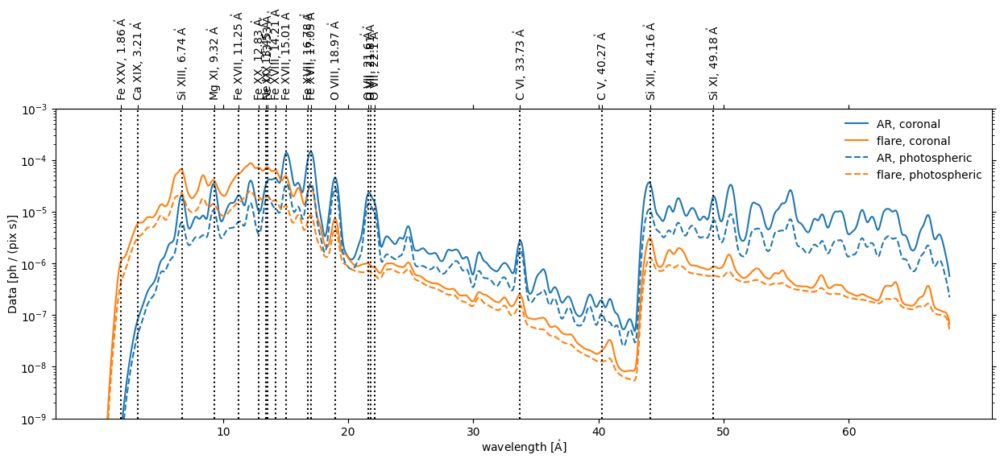

In [238]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(111, projection=ar_coronal_all_flux.wcs)
ar_coronal_all_flux.plot(axes=ax, color='C0', label='AR, coronal')
flare_coronal_all_flux.plot(axes=ax, color='C1', label='flare, coronal')
ar_photospheric_all_flux.plot(axes=ax, color='C0', ls='--', label='AR, photospheric')
flare_photospheric_all_flux.plot(axes=ax, color='C1', ls='--', label='flare, photospheric')
ax.set_yscale('log')
ax.set_ylim(1e-9,1e-3)
#ax.set_xlim(ar_coronal_all_flux.wcs.world_to_pixel([13,25]*u.angstrom))
add_line_ids_to_axis(ax, line_ids)
ax.legend(frameon=False)

/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/a

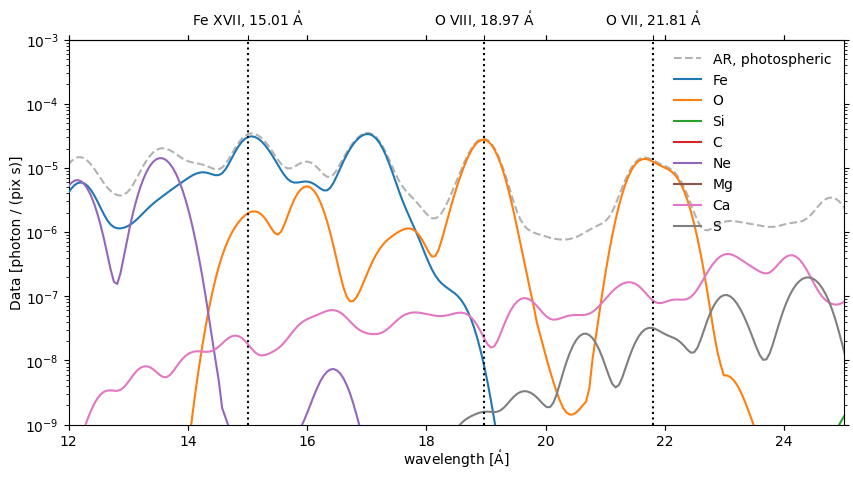

In [250]:
fig = plt.figure(figsize=(10,5))
# Line properties
all_line_props = {'data_unit': 'photon / (pix s)',
                  #'label': 'all',
                  #'color': 'k',
                  'ls': '--',
                  'alpha': 0.3}
ax = fig.add_subplot(projection=ar_coronal_all_flux.wcs)
ar_photospheric_all_flux.plot(axes=ax, **all_line_props, color='k', label='AR, photospheric')
for el in ['Fe', 'O', 'Si', 'C', 'Ne', 'Mg', 'Ca', 'S']:
    k = f'unity_{el.lower()}'
    spt = spec_tables[k] * get_abundance(el, 'sun_photospheric_2015_scott')
    ar_coronal_el = degrade_spectra(convolve_with_response(InstrumentDEM.calculate_intensity(ar_dem, spt, {}), chan, electrons=False), kernel)
    ar_coronal_el.plot(axes=ax, data_unit='photon / (pix s)', label=el,)
ax.set_ylim(1e-9,1e-3)
ax.set_xlim(ar_coronal_all_flux.wcs.world_to_pixel([12,25]*u.angstrom))
ax.set_yscale('log')
ax.legend(frameon=False)
add_line_ids_to_axis(ax, [line_ids[1], line_ids[5], line_ids[7]], rotation=0)

/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/astropy/units/quantity.py:626: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/wtbarnes/mambaforge/envs/mocksipipeline/lib/python3.9/site-packages/a

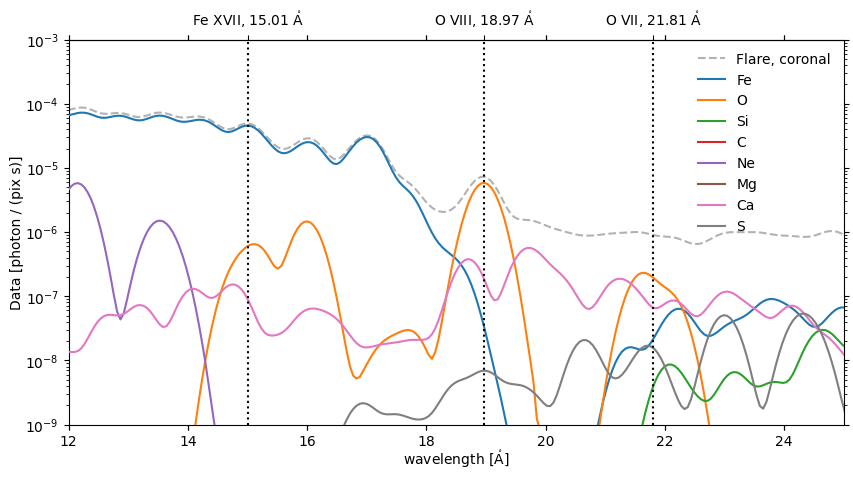

In [255]:
fig = plt.figure(figsize=(10,5))
# Line properties
all_line_props = {'data_unit': 'photon / (pix s)',
                  #'label': 'all',
                  #'color': 'k',
                  'ls': '--',
                  'alpha': 0.3}
ax = fig.add_subplot(projection=flare_coronal_all_flux.wcs)
flare_coronal_all_flux.plot(axes=ax, **all_line_props, color='k', label='Flare, coronal')
for el in ['Fe', 'O', 'Si', 'C', 'Ne', 'Mg', 'Ca', 'S']:
    k = f'unity_{el.lower()}'
    # Get spectral tables and multiply by abundances
    spt = spec_tables[k] * get_abundance(el, 'sun_coronal_1992_feldman_ext')
    flare_coronal_el = degrade_spectra(convolve_with_response(InstrumentDEM.calculate_intensity(flare_dem, spt, {}), chan, electrons=False), kernel)
    flare_coronal_el.plot(axes=ax, data_unit='photon / (pix s)', label=el)
ax.set_ylim(1e-9,1e-3)
ax.set_xlim(ar_coronal_all_flux.wcs.world_to_pixel([12,25]*u.angstrom))
ax.set_yscale('log')
ax.legend(frameon=False)
add_line_ids_to_axis(ax, [line_ids[1], line_ids[5], line_ids[7]], rotation=0)

## Line Ratio Diagnostics

In [93]:
for i,l in enumerate(line_ids):
    print(i,l)

0 ('Fe XVIII', <Quantity 14.21 Angstrom>)
1 ('Fe XVII', <Quantity 15.01 Angstrom>)
2 ('Fe XVII', <Quantity 16.78 Angstrom>)
3 ('Fe XVII', <Quantity 17.05 Angstrom>)
4 ('O VII', <Quantity 21.6 Angstrom>)
5 ('O VII', <Quantity 21.81 Angstrom>)
6 ('O VII', <Quantity 22.1 Angstrom>)
7 ('O VIII', <Quantity 18.97 Angstrom>)
8 ('Fe XXV', <Quantity 1.86 Angstrom>)
9 ('Ca XIX', <Quantity 3.21 Angstrom>)
10 ('Si XIII', <Quantity 6.74 Angstrom>)
11 ('Mg XI', <Quantity 9.32 Angstrom>)
12 ('Fe XVII', <Quantity 11.25 Angstrom>)
13 ('Fe XX', <Quantity 12.83 Angstrom>)
14 ('Ne IX', <Quantity 13.45 Angstrom>)
15 ('Fe XIX', <Quantity 13.53 Angstrom>)
16 ('C VI', <Quantity 33.73 Angstrom>)
17 ('C V', <Quantity 40.27 Angstrom>)
18 ('Si XII', <Quantity 44.16 Angstrom>)
19 ('Si XI', <Quantity 49.18 Angstrom>)


The three lines we care about are Fe XVII (15.01), O VII (21.81), and O VIII (18.97) so three combinations are 

1. Fe XVII / O VII
2. Fe XVII / O VIII
3. O VIII / O VII (independent of abundance)

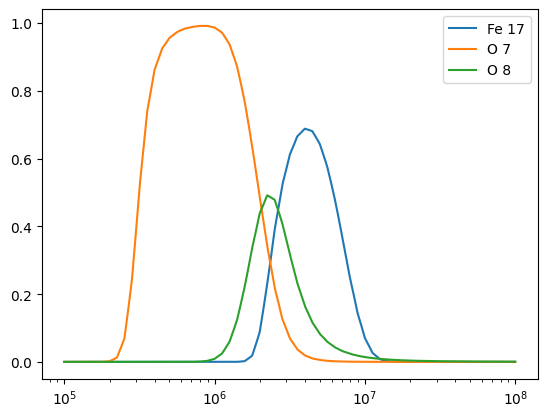

In [192]:
fe17 = fiasco.Ion('Fe 17', np.logspace(5,8,1000)*u.K)
o7 = fiasco.Ion('O 7', fe17.temperature)
o8 = o7.next_ion()
for ion in [fe17, o7, o8]:
    plt.plot(ion.temperature, ion.ioneq, label=ion.ion_name)
plt.legend()
plt.xscale('log')

In [176]:
norm = ImageNormalize(vmin=1, vmax=25,)

In [ ]:
pos = ax2.get_position().get_points()
pad_y = 0.01
cax2 = fig.add_axes((pos[0,0], pos[1,1] + pad_y, pos[1,0]-pos[0,0], 0.04))
fig.colorbar(im2,cax=cax2,ax=ax2,orientation='horizontal')


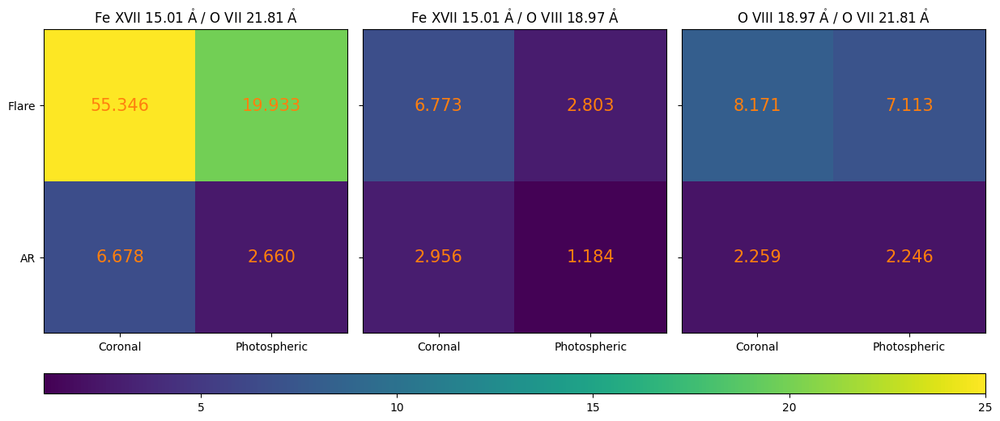

In [308]:
fig,axes = plt.subplots(1,3,figsize=(15,5),sharex=True,sharey=True, constrained_layout=False,)
plt.subplots_adjust(wspace=0.05)
# Fe XVII/O VII
for i,(j,k) in enumerate([(1,5), (1,7), (7,5)]):
    ax = axes[i]
    line_ratio_square = np.zeros((2,2))
    line_num = line_ids[j]
    line_denom = line_ids[k]
    line_ratio_square[0,0] = get_line_ratio(ar_coronal_all_flux, line_num[1], line_denom[1])
    line_ratio_square[1,0] = get_line_ratio(flare_coronal_all_flux, line_num[1], line_denom[1])
    line_ratio_square[0,1] = get_line_ratio(ar_photospheric_all_flux, line_num[1], line_denom[1])
    line_ratio_square[1,1] = get_line_ratio(flare_photospheric_all_flux, line_num[1], line_denom[1])
    im = ax.imshow(line_ratio_square, origin='lower', norm=norm)
    ax.set_xticks(ticks=[0,1], labels=['Coronal', 'Photospheric'])
    ax.set_yticks(ticks=[0,1], labels=['AR', 'Flare'])
    ax.set_title(f'{line_num[0]} {line_num[1].to_string(format="latex_inline")} / {line_denom[0]} {line_denom[1].to_string(format="latex_inline")}')
    for (l,m),_ in np.ndenumerate(np.array([[0,1],[0,1]])):
        ax.text(m,l,f'{line_ratio_square[l,m]:.3f}', horizontalalignment='center', verticalalignment='center', color='C1', fontsize=15)
pos_1 = axes[0].get_position().get_points()
pos_2 = axes[-1].get_position().get_points()
cax = fig.add_axes((pos_1[0,0], pos_1[0,1]-0.15, pos_2[1,0]-pos_1[0,0], 0.05))
fig.colorbar(im, cax=cax, ax=axes[0], orientation='horizontal')

Questionable what is actually happening with this C VI/V line ratio. There is obviously something that is still persisting even once that C V line completely disappears in the flare spectra.

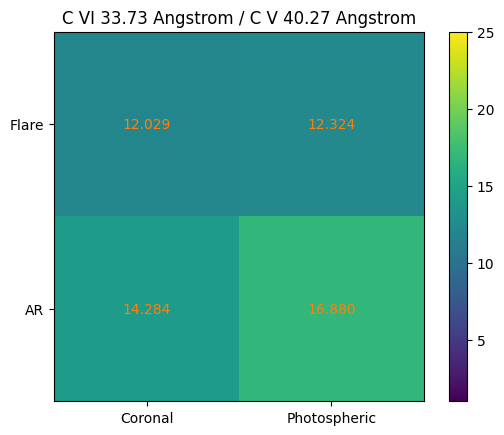

In [180]:
line_ratio_square = np.zeros((2,2))
line_num = line_ids[16]
line_denom = line_ids[17]
line_ratio_square[0,0] = get_line_ratio(ar_coronal_all_flux, line_num[1], line_denom[1])
line_ratio_square[1,0] = get_line_ratio(flare_coronal_all_flux, line_num[1], line_denom[1])
line_ratio_square[0,1] = get_line_ratio(ar_photospheric_all_flux, line_num[1], line_denom[1])
line_ratio_square[1,1] = get_line_ratio(flare_photospheric_all_flux, line_num[1], line_denom[1])
plt.imshow(line_ratio_square, origin='lower', norm=norm)
plt.xticks(ticks=[0,1], labels=['Coronal', 'Photospheric'])
plt.yticks(ticks=[0,1], labels=['AR', 'Flare'])
plt.title(f'{line_num[0]} {line_num[1]} / {line_denom[0]} {line_denom[1]}')
plt.colorbar()
for (i,j),_ in np.ndenumerate(np.array([[0,1],[0,1]])):
    plt.text(j,i,f'{line_ratio_square[i,j]:.3f}', horizontalalignment='center', verticalalignment='center', color='C1')